In [1]:

import open3d as o3d
import numpy as np
from open3d.web_visualizer import draw



Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[Open3D INFO] Resetting default logger to print to terminal.


In [2]:



cube_red = o3d.geometry.TriangleMesh.create_box(1, 2, 4)
cube_red.compute_vertex_normals()
cube_red.paint_uniform_color((1.0, 0.0, 0.0))
draw(cube_red)

cube_blue = o3d.geometry.TriangleMesh.create_box(1, 2, 4)
cube_blue.compute_vertex_normals()
cube_blue.paint_uniform_color((0.0, 0.0, 1.0))
draw(cube_blue)





[Open3D INFO] Window window_0 created.
[Open3D INFO] EGL headless mode enabled.
[Open3D INFO] ICE servers: {"stun:stun.l.google.com:19302", "turn:user:password@34.69.27.100:3478", "turn:user:password@34.69.27.100:3478?transport=tcp"}
[Open3D INFO] Set WEBRTC_STUN_SERVER environment variable add a customized WebRTC STUN server.
[Open3D INFO] WebRTC Jupyter handshake mode enabled.


WebVisualizer(window_uid='window_0')

FEngine (64 bits) created at 0x7fdfb6841010 (threading is enabled)
EGL(1.5)
OpenGL(4.1)
[Open3D INFO] Window window_1 created.


WebVisualizer(window_uid='window_1')

In [3]:
import open3d.core as o3c
import numpy as np
# Tensor from list.
a = o3c.Tensor([0, 1, 2])
print("Created from list:\n{}".format(a))

# Tensor from Numpy.
a = o3c.Tensor(np.array([0, 1, 2]))
print("\nCreated from numpy array:\n{}".format(a))

# Dtype and inferred from list.
a_float = o3c.Tensor([0.0, 1.0, 2.0])
print("\nDefault dtype and device:\n{}".format(a_float))

# Specify dtype.
a = o3c.Tensor(np.array([0, 1, 2]), dtype=o3c.Dtype.Float64)
print("\nSpecified data type:\n{}".format(a))

# Specify device.
a = o3c.Tensor(np.array([0, 1, 2]), device=o3c.Device("CUDA:0"))
print("\nSpecified device:\n{}".format(a))

Created from list:
[0 1 2]
Tensor[shape={3}, stride={1}, Int64, CPU:0, 0x55fb7aef2880]

Created from numpy array:
[0 1 2]
Tensor[shape={3}, stride={1}, Int64, CPU:0, 0x55fb7b1e5290]

Default dtype and device:
[0.0 1.0 2.0]
Tensor[shape={3}, stride={1}, Float64, CPU:0, 0x55fb7b1e86b0]

Specified data type:
[0.0 1.0 2.0]
Tensor[shape={3}, stride={1}, Float64, CPU:0, 0x55fb7afb2650]

Specified device:
[0 1 2]
Tensor[shape={3}, stride={1}, Int64, CUDA:0, 0x402000000]


In [56]:
print("Load a ply point cloud, print it, and render it")
pcd = o3d.io.read_point_cloud("data/coconut/row1-2.ply")
#pcd = o3d.io.read_point_cloud("/media/hdd10T/torchDDP/3d/data/Set0-georeferenced_model.ply")
print(pcd)
print(np.asarray(pcd.points))

#o3d.visualization.draw_geometries([pcd])
draw(pcd)

Load a ply point cloud, print it, and render it
PointCloud with 14825 points.
[[ 2.21320673 -2.43794469 -1.05417498]
 [ 0.65919062 -2.49595097 -0.99917468]
 [ 0.91022822 -2.59395055  0.4048256 ]
 ...
 [ 0.05421015 -2.86694554 -0.67217501]
 [ 0.13019892 -2.85595158 -0.6841751 ]
 [-0.01579717 -2.93194798 -0.69117507]]
[Open3D INFO] Window window_38 created.


WebVisualizer(window_uid='window_38')

In [5]:

draw(pcd)
#o3d.visualization.draw_geometries([pcd],
#                                  zoom=0.3412,
#                                  front=[0.4257, -0.2125, -0.8795],
#                                  lookat=[2.6172, 2.0475, 1.532],
#                                  up=[-0.0694, -0.9768, 0.2024])

[Open3D INFO] Window window_3 created.


WebVisualizer(window_uid='window_3')

In [10]:
import math
import itertools
bounds = [[-math.inf, math.inf], [-math.inf, math.inf], [8, 8.3]]  # set the bounds
bounding_box_points = list(itertools.product(*bounds))  # create limit points
bounding_box = o3d.geometry.AxisAlignedBoundingBox.create_from_points(
    o3d.utility.Vector3dVector(bounding_box_points))  # create bounding box object
print(bounding_box)
# Crop the point cloud using the bounding box:
pcd_croped = pcd.crop(bounding_box)

# Display the cropped point cloud:
#o3d.visualization.draw_geometries([pcd_croped])
draw(pcd_croped)


AxisAlignedBoundingBox: min: (-inf, -inf, 8), max: (inf, inf, 8.3)
[Open3D INFO] Window window_5 created.
[Open3D WARNING] Geometry Object 1 is not in the scene graph


WebVisualizer(window_uid='window_5')

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

In [8]:
points = np.asarray(np.asarray(pcd.points))

In [9]:
colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif cloud.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5
else:
    geometry.paint_uniform_color((1.0, 0.0, 0.0))
    colors = np.asarray(geometry.colors)

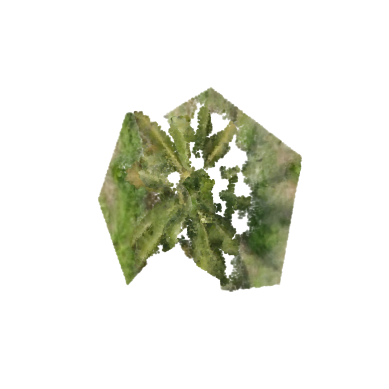

In [13]:
# Single View
ax = plt.axes(projection='3d')
ax.view_init(90, -90)
ax.axis("off")
ax.scatter(points[:,0], points[:,1], points[:,2], s=1, c=colors)
plt.show()

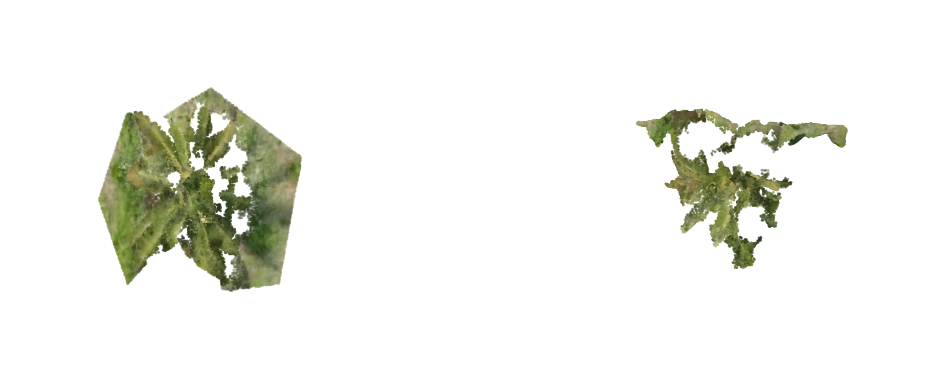

[000:000][821283] (stun_port.cc:96): Binding request timed out from 172.18.0.x:37020 (br-104b05af6c0d)
[000:000][821283] (stun_port.cc:96): Binding request timed out from 172.17.0.x:52002 (docker0)
[000:000][821283] (stun_port.cc:96): Binding request timed out from 158.108.180.x:51242 (enp6s0)
[000:000][821283] (stun_port.cc:96): Binding request timed out from 192.168.122.x:34174 (virbr0)
[000:010][821283] (stun_port.cc:96): Binding request timed out from 172.18.0.x:57738 (br-104b05af6c0d)
[000:010][821283] (stun_port.cc:96): Binding request timed out from 172.17.0.x:40318 (docker0)
[000:011][821283] (stun_port.cc:96): Binding request timed out from 158.108.180.x:34371 (enp6s0)
[000:011][821283] (stun_port.cc:96): Binding request timed out from 192.168.122.x:39817 (virbr0)


In [14]:
# Multi View
figsize = plt.rcParams.get('figure.figsize')
fig = plt.figure(figsize=(figsize[0] * 2, figsize[1]))
ax1 = fig.add_subplot(1, 2, 1, projection = '3d')
ax2 = fig.add_subplot(1, 2, 2, projection = '3d')
ax1.axis("off")
ax1.view_init(90, -90) # front view
ax1.scatter(points[:,0], points[:,1], points[:,2], s=1, c=colors)
ax2.axis("off")
ax2.view_init(90 + 90, -90) # top view
ax2.scatter(points[:,0], points[:,1], points[:,2], s=1, c=colors)
plt.show()

In [15]:
import plotly.graph_objects as go

[012:836][821283] (stun_port.cc:96): Binding request timed out from 172.18.0.x:46172 (br-104b05af6c0d)
[012:836][821283] (stun_port.cc:96): Binding request timed out from 172.17.0.x:45162 (docker0)
[012:836][821283] (stun_port.cc:96): Binding request timed out from 158.108.180.x:53874 (enp6s0)
[012:836][821283] (stun_port.cc:96): Binding request timed out from 192.168.122.x:49726 (virbr0)
[016:584][821283] (stun_port.cc:96): Binding request timed out from 172.18.0.x:32854 (br-104b05af6c0d)
[016:584][821283] (stun_port.cc:96): Binding request timed out from 172.17.0.x:36629 (docker0)
[016:584][821283] (stun_port.cc:96): Binding request timed out from 158.108.180.x:57498 (enp6s0)
[016:584][821283] (stun_port.cc:96): Binding request timed out from 192.168.122.x:51785 (virbr0)
[143605:087][821283] (stun_port.cc:96): Binding request timed out from 158.108.180.x:51242 (enp6s0)
[143608:030][821283] (stun_port.cc:96): Binding request timed out from 172.18.0.x:46172 (br-104b05af6c0d)
[143608:91

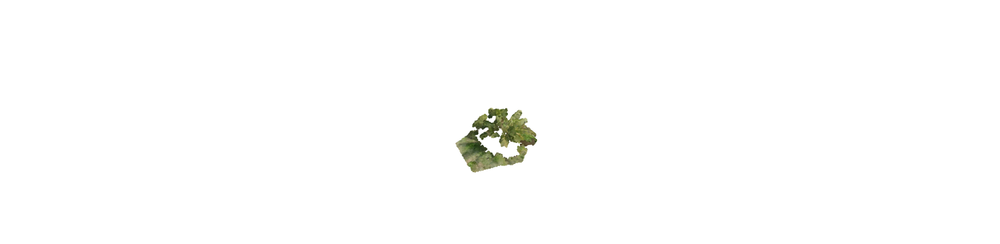

In [14]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=points[:,0], y=points[:,1], z=points[:,2], 
            mode='markers',
            marker=dict(size=1, color=colors)
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()

In [11]:
#voxel downsampling
size=0.05
print("Downsample the point cloud with a voxel of {}".format(size))
downpcd = pcd.voxel_down_sample(voxel_size=size)

# Random down-sampling:
random_pcd = pcd.random_down_sample(sampling_ratio=0.05)

# Uniform down-sampling:
uniform_pcd = pcd.uniform_down_sample(every_k_points=20)

# Voxel down-sampling:
voxel_pcd = pcd.voxel_down_sample(voxel_size=0.4)
#o3d.visualization.draw_geometries([downpcd])

draw(downpcd)

draw(random_pcd)
draw(uniform_pcd)
                                 

Downsample the point cloud with a voxel of 0.05
[Open3D INFO] Window window_6 created.


WebVisualizer(window_uid='window_6')

[Open3D INFO] Window window_7 created.


WebVisualizer(window_uid='window_7')

[Open3D INFO] Window window_8 created.


WebVisualizer(window_uid='window_8')

In [12]:
#normal estimation
print("Recompute the normal of the downsampled point cloud")
downpcd.estimate_normals(
    search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30))
o3d.visualization.draw_geometries([downpcd])

draw(downpcd)
                                
                                  

Recompute the normal of the downsampled point cloud
[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.
[Open3D INFO] Window window_9 created.


WebVisualizer(window_uid='window_9')

# Try examples

In [31]:
#http://www.open3d.org/docs/release/tutorial/geometry/pointcloud.html

In [7]:
print("Print a normal vector of the 0th point")
print(downpcd.normals[0])

Print a normal vector of the 0th point
[ 0.07797643  0.12974395 -0.9884767 ]


[000:000][928798] (stun_port.cc:96): Binding request timed out from 172.18.0.x:57893 (br-104b05af6c0d)
[000:000][928798] (stun_port.cc:96): Binding request timed out from 172.17.0.x:35708 (docker0)
[000:000][928798] (stun_port.cc:96): Binding request timed out from 158.108.180.x:41045 (enp6s0)
[000:000][928798] (stun_port.cc:96): Binding request timed out from 192.168.122.x:47845 (virbr0)
[000:171][928798] (stun_port.cc:96): Binding request timed out from 192.168.122.x:47845 (virbr0)
[000:171][928798] (stun_port.cc:96): Binding request timed out from 158.108.180.x:41045 (enp6s0)
[000:171][928798] (stun_port.cc:96): Binding request timed out from 172.18.0.x:57893 (br-104b05af6c0d)
[000:171][928798] (stun_port.cc:96): Binding request timed out from 172.17.0.x:35708 (docker0)
[013:711][928798] (stun_port.cc:96): Binding request timed out from 172.18.0.x:43843 (br-104b05af6c0d)
[013:712][928798] (stun_port.cc:96): Binding request timed out from 172.17.0.x:40695 (docker0)
[013:712][928798] 

In [33]:
print("Print the normal vectors of the first 10 points")
print(np.asarray(downpcd.normals)[:10, :])


Print the normal vectors of the first 10 points
[[-0.39453467  0.9091445   0.13341168]
 [ 0.          0.          1.        ]
 [-0.08489841 -0.1649416   0.98264262]
 [-0.28699982  0.39866955  0.87103025]
 [ 0.55431562  0.80101678  0.22606707]
 [ 0.39217517  0.02641559 -0.9195112 ]
 [ 0.48984555 -0.78310175  0.38314878]
 [ 0.91005694  0.10713463  0.40039798]
 [-0.44692531  0.85647758  0.25827102]
 [ 0.07611784 -0.92123049 -0.38149766]]


In [32]:
points = np.asarray(pcd.points)
np.random.shuffle(points)
u_pcd= o3d.geometry.PointCloud()
u_pcd.points= o3d.utility.Vector3dVector(points)
draw(u_pcd)

[Open3D INFO] Window window_29 created.


WebVisualizer(window_uid='window_29')

In [6]:
from pyvirtualdisplay import Display
display = Display(visible=0,size=(2048,2048))
display.start( )

In [13]:
import open3d as o3d
import numpy as np
from open3d.web_visualizer import draw

[408:925][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:60259 (br-104b05af6c0d)
[408:925][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:39698 (docker0)
[408:925][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:41826 (enp6s0)
[408:925][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:54460 (virbr0)


In [58]:
pcd = o3d.io.read_point_cloud("data/palm/p1.ply")

In [57]:
pcd = o3d.io.read_point_cloud("data/coconut/row1-1.ply")

In [59]:
def display_inlier_outlier(cloud, ind):
    inlier_cloud = cloud.select_by_index(ind)
    outlier_cloud = cloud.select_by_index(ind, invert=True)

    print("Showing outliers (red) and inliers (blue): ")
    outlier_cloud.paint_uniform_color([1, 0, 0])
    inlier_cloud.paint_uniform_color([0, 0, 1])
    draw([inlier_cloud,outlier_cloud])
  

In [60]:
draw(pcd)

[Open3D INFO] Window window_39 created.


WebVisualizer(window_uid='window_39')

In [4]:
#uni_down_pcd = pcd.uniform_down_sample(every_k_points=2)
#draw(uni_down_pcd)

[Open3D INFO] Window window_0 created.
[Open3D INFO] EGL headless mode enabled.
[Open3D INFO] ICE servers: {"stun:stun.l.google.com:19302", "turn:user:password@34.69.27.100:3478", "turn:user:password@34.69.27.100:3478?transport=tcp"}
FEngine (64 bits) created at 0x7f03fd17a010 (threading is enabled)
[Open3D INFO] Set WEBRTC_STUN_SERVER environment variable add a customized WebRTC STUN server.
[Open3D INFO] WebRTC Jupyter handshake mode enabled.


WebVisualizer(window_uid='window_0')

In [16]:
print("Statistical oulier removal")
cl, ind = pcd.remove_statistical_outlier(nb_neighbors=20,
                                                    std_ratio=5.0)
display_inlier_outlier(pcd,ind)

Statistical oulier removal
Showing outliers (red) and inliers (blue): 
[Open3D INFO] Window window_11 created.


WebVisualizer(window_uid='window_11')

In [17]:
print("Statistical oulier removal")
cl, ind = pcd.remove_statistical_outlier(nb_neighbors=50,
                                                    std_ratio=0.05)
display_inlier_outlier(pcd,ind)

Statistical oulier removal
Showing outliers (red) and inliers (blue): 
[Open3D INFO] Window window_12 created.


WebVisualizer(window_uid='window_12')

In [18]:
#pcd = pcd.voxel_down_sample(voxel_size=0.02)



# Radius outlier removal:
pcd_rad, ind_rad = pcd.remove_radius_outlier(nb_points=50, radius=0.2)
draw(pcd_rad)

outlier_rad_pcd = pcd.select_by_index(ind_rad, invert=True)
outlier_rad_pcd.paint_uniform_color([1., 0., 1.])

#draw(outlier_rad_pcd)
display_inlier_outlier(pcd,ind_rad)

[Open3D INFO] Window window_13 created.


WebVisualizer(window_uid='window_13')

Showing outliers (red) and inliers (blue): 
[Open3D INFO] Window window_14 created.


WebVisualizer(window_uid='window_14')

In [19]:


# Statistical outlier removal:
pcd_stat, ind_stat = pcd.remove_statistical_outlier(nb_neighbors=300,
                                             std_ratio=.05)
draw(pcd_stat)
inlier_cloud = pcd.select_by_index(ind_stat)
inlier_cloud.paint_uniform_color([0, 0, 1])
print(len(inlier_cloud.points))

draw(inlier_cloud)
outlier_stat_pcd = pcd.select_by_index(ind_stat, invert=True)
outlier_stat_pcd.paint_uniform_color([1., 0., 0.])

# Translate to visualize:
points = np.asarray(pcd_stat.points)
points += [3, 0, 0]
pcd_stat.points = o3d.utility.Vector3dVector(points)

points = np.asarray(outlier_stat_pcd.points)
points += [3, 0, 0]
outlier_stat_pcd.points = o3d.utility.Vector3dVector(points)

print(len(outlier_stat_pcd.points))
draw([inlier_cloud,outlier_stat_pcd])

# Display:
#o3d.visualization.draw_geometries([pcd_stat, pcd_rad, outlier_stat_pcd, outlier_rad_pcd])





[Open3D INFO] Window window_15 created.


WebVisualizer(window_uid='window_15')

18353
[Open3D INFO] Window window_16 created.


WebVisualizer(window_uid='window_16')

9975
[Open3D INFO] Window window_17 created.


WebVisualizer(window_uid='window_17')

In [20]:
draw([inlier_cloud,outlier_stat_pcd])

[Open3D INFO] Window window_18 created.


WebVisualizer(window_uid='window_18')

In [22]:
pcd = o3d.io.read_point_cloud("data/palm/p1.ply")
obb = pcd.get_oriented_bounding_box()
pts2 = np.array(obb.get_box_points())
pts2 = pts2.astype("float64")

In [23]:
# Load data
#demo_crop_data = o3d.data.DemoCropPointCloud()
#pcd = o3d.io.read_point_cloud(demo_crop_data.point_cloud_path)
#vol = o3d.visualization.read_selection_polygon_volume(demo_crop_data.cropped_json_path)
#chair = vol.crop_point_cloud(pcd)

vol = o3d.visualization.SelectionPolygonVolume()

 
#use to subtract point clouds from the scene
vol.bounding_polygon = o3d.utility.Vector3dVector(pts2)

pcd2 = vol.crop_point_cloud(pcd)

#dists = pcd.compute_point_cloud_distance(chair)

dists = pcd.compute_point_cloud_distance(pcd)
print(dists)
dists = np.asarray(dists)
ind = np.where(dists > 0.01)[0]
pcd_without = pcd.select_by_index(ind)

#we get empty scence
"""o3d.visualization.draw_geometries([pcd_without ],
                                  #zoom=0.3412,
                                  #front=[0.4257, -0.2125, -0.8795],
                                  #lookat=[2.6172, 2.0475, 1.532],
                                  #up=[-0.0694, -0.9768, 0.2024]
                                 )"""
draw(pcd_without)

DoubleVector[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

WebVisualizer(window_uid='window_19')

In [24]:
pcd.estimate_normals(
    search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30))

In [25]:
distances = pcd.compute_nearest_neighbor_distance()
avg_dist = np.mean(distances)
radius = 3 * avg_dist

[479:790][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:57311 (br-104b05af6c0d)
[479:791][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:55154 (docker0)
[479:791][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:54933 (enp6s0)
[479:791][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:47277 (virbr0)


In [26]:
#computing the mehs
bpa_mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(pcd,o3d.utility.DoubleVector([radius, radius * 0.3]))
bpa_mesh.compute_vertex_normals()
draw(bpa_mesh)
print(bpa_mesh)

[Open3D INFO] Window window_20 created.


WebVisualizer(window_uid='window_20')

TriangleMesh with 953 points and 1222 triangles.


In [27]:
mesh,densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
        pcd, depth=9)
draw(mesh)
print(mesh)

[Open3D INFO] Window window_21 created.


WebVisualizer(window_uid='window_21')

TriangleMesh with 4135 points and 8114 triangles.


In [28]:
print(densities)

DoubleVector[4.70396, 4.50601, 4.60468, 4.71233, 4.74745, 4.51332, 4.7654, 5.02042, 5.01656, 4.60413, 4.87139, 4.7327, 4.95264, 4.08464, 4.24366, 4.60537, 4.81933, 5.03382, 5.05688, 5.13377, 5.11611, 5.05859, 4.88474, 4.91329, 4.98713, 4.90121, 4.82629, 5.05367, 4.9326, 5.05566, 4.99916, 4.98601, 5.12501, 5.05941, 5.00125, 4.95139, 4.75142, 4.73486, 4.76628, 4.94959, 5.00165, 4.20511, 4.41677, 4.71382, 4.41388, 4.67272, 4.97373, 5.10869, 5.09304, 5.06189, 5.18481, 5.11432, 5.01686, 5.0637, 4.96056, 4.89894, 4.98162, 5.10488, 4.91745, 4.9342, 3.70671, 4.5013, 4.86792, 3.9143, 4.49693, 4.26039, 4.85464, 4.49923, 4.28421, 4.5199, 3.90885, 4.46087, 4.0919, 3.85288, 4.8421, 4.59572, 4.08389, 3.7118, 4.87153, 4.84524, 4.4673, 4.51046, 4.09295, 4.47958, 4.45353, 4.15396, 4.45555, 4.40916, 4.50546, 4.58613, 4.44967, 4.1495, 4.54558, 4.59366, 4.48682, 4.60562, 4.49114, 4.88316, 4.01427, 4.88402, 4.21465, 4.74027, 4.68627, 4.42952, 4.6057, 4.82136, 4.83223, 4.95518, 5.06261, 5.06281, 5.14112, 5.

In [30]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
print('visualize densities')
densities = np.asarray(densities)
density_colors = plt.get_cmap('plasma')(
    (densities - densities.min()) / (densities.max() - densities.min()))
density_colors = density_colors[:, :3]

#density_mesh.vertices = mesh.vertices
#density_mesh.triangles = mesh.triangles
#density_mesh.triangle_normals = mesh.triangle_normals
mesh.vertex_colors = o3d.utility.Vector3dVector(density_colors)
draw(mesh)

visualize densities
[Open3D INFO] Window window_22 created.


WebVisualizer(window_uid='window_22')

In [31]:
pcd.orient_normals_consistent_tangent_plane(100)
#o3d.visualization.draw_geometries([pcd], point_show_normal=True)
#draw(pcd,point_show_normal=True)

In [32]:
print('remove low density vertices')
vertices_to_remove = densities < np.quantile(densities, 0.01)

remove low density vertices


In [33]:
vertices_to_remove

array([False, False, False, ..., False, False, False])

In [34]:
mesh.remove_vertices_by_mask(vertices_to_remove)

In [35]:


print(mesh)
draw(mesh)

TriangleMesh with 4093 points and 8040 triangles.
[Open3D INFO] Window window_23 created.


WebVisualizer(window_uid='window_23')

In [36]:
tetra_mesh, pt_map = o3d.geometry.TetraMesh.create_from_point_cloud(pcd)
for alpha in np.logspace(np.log10(0.5), np.log10(0.01), num=4):
    print(f"alpha={alpha:.3f}")
    #mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd, depth=8, width=0, scale=1.1, linear_fit=False)[0]
    mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(
        pcd, alpha, tetra_mesh, pt_map)
    mesh.compute_vertex_normals()
    draw(mesh)
    print(mesh)
    #o3d.visualization.draw_geometries([mesh] ) #mesh_show_back_face=True)


alpha=0.500
[Open3D INFO] Window window_24 created.


WebVisualizer(window_uid='window_24')

TriangleMesh with 855 points and 2024 triangles.
alpha=0.136
[Open3D INFO] Window window_25 created.


WebVisualizer(window_uid='window_25')

TriangleMesh with 4 points and 4 triangles.
alpha=0.037
[Open3D INFO] Window window_26 created.
[Open3D WARNING] Geometry Object 1 is not in the scene graph


WebVisualizer(window_uid='window_26')

TriangleMesh with 0 points and 0 triangles.
alpha=0.010
[Open3D INFO] Window window_27 created.
[Open3D WARNING] Geometry Object 1 is not in the scene graph


WebVisualizer(window_uid='window_27')

TriangleMesh with 0 points and 0 triangles.


In [37]:
tetra_mesh, pt_map = o3d.geometry.TetraMesh.create_from_point_cloud(pcd)
for alpha in np.logspace(np.log10(0.1), np.log10(0.01), num=4):
    print(f"alpha={alpha:.3f}")
    mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd, depth=8, width=0, scale=1.1, linear_fit=False)[0]
      
    mesh.compute_vertex_normals()
    draw(mesh)
    #o3d.visualization.draw_geometries([mesh] ) #mesh_show_back_face=True)


alpha=0.100
[Open3D INFO] Window window_28 created.


WebVisualizer(window_uid='window_28')

alpha=0.046
[Open3D INFO] Window window_29 created.


WebVisualizer(window_uid='window_29')

alpha=0.022
[Open3D INFO] Window window_30 created.


WebVisualizer(window_uid='window_30')

alpha=0.010
[Open3D INFO] Window window_31 created.


WebVisualizer(window_uid='window_31')

In [38]:
if not mesh.has_vertex_normals(): mesh.compute_vertex_normals()
if not mesh.has_triangle_normals(): mesh.compute_triangle_normals()
triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)
colors = None
if mesh.has_triangle_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(mesh.triangle_normals) * 0.5
    colors = tuple(map(tuple, colors))
else:
    colors = (1.0, 0.0, 0.0)

In [39]:
fig = go.Figure(
    data=[
        go.Mesh3d(
            x=vertices[:,0],
            y=vertices[:,1],
            z=vertices[:,2],
            i=triangles[:,0],
            j=triangles[:,1],
            k=triangles[:,2],
            facecolor=colors,
            opacity=0.80)
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()

NameError: name 'go' is not defined

In [75]:
def draw_geometries(geometries):
    graph_objects = []

    for geometry in geometries:
        geometry_type = geometry.get_geometry_type()
        
        if geometry_type == o3d.geometry.Geometry.Type.PointCloud:
            points = np.asarray(geometry.points)
            colors = None
            if geometry.has_colors():
                colors = np.asarray(geometry.colors)
            elif geometry.has_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.normals) * 0.5
            else:
                geometry.paint_uniform_color((1.0, 0.0, 0.0))
                colors = np.asarray(geometry.colors)

            scatter_3d = go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode='markers', marker=dict(size=1, color=colors))
            graph_objects.append(scatter_3d)

        if geometry_type == o3d.geometry.Geometry.Type.TriangleMesh:
            triangles = np.asarray(geometry.triangles)
            vertices = np.asarray(geometry.vertices)
            colors = None
            if geometry.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                colors = (1.0, 0.0, 0.0)
            
            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)
        
    fig = go.Figure(
        data=graph_objects,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False)
            )
        )
    )
    fig.show()

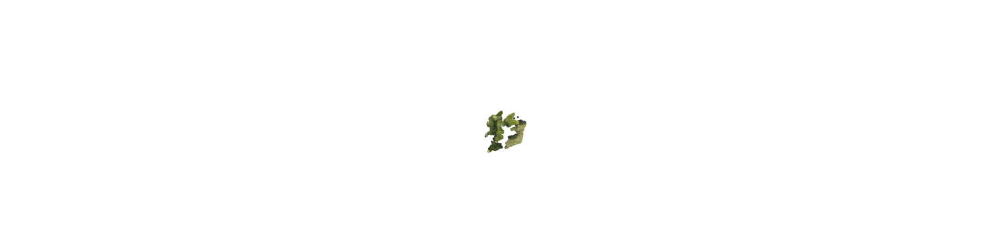

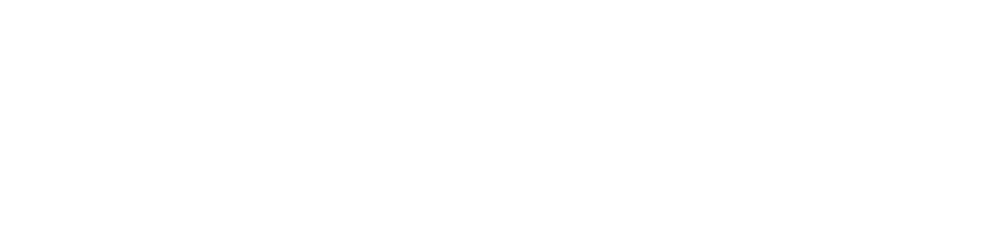

In [76]:
o3d.visualization.draw_geometries = draw_geometries # replace function
o3d.visualization.draw_geometries([pcd])
o3d.visualization.draw_geometries([mesh])

In [41]:
points = (np.random.rand(1000, 3) - 0.5) / 4
colors = np.random.rand(1000, 3)

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
pcd.colors = o3d.utility.Vector3dVector(colors)




In [42]:
print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud(ply_point_cloud.path)
print(pcd)
print(np.asarray(pcd.points))
o3d.visualization.draw_geometries([pcd],
                                  zoom=0.3412,
                                  front=[0.4257, -0.2125, -0.8795],
                                  lookat=[2.6172, 2.0475, 1.532],
                                  up=[-0.0694, -0.9768, 0.2024])

Load a ply point cloud, print it, and render it
PointCloud with 196133 points.
[[0.65234375 0.84686458 2.37890625]
 [0.65234375 0.83984375 2.38430572]
 [0.66737998 0.83984375 2.37890625]
 ...
 [2.00839925 2.39453125 1.88671875]
 [2.00390625 2.39488506 1.88671875]
 [2.00390625 2.39453125 1.88793314]]
[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


[596:199][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:49835 (br-104b05af6c0d)
[596:199][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:52542 (docker0)
[596:199][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:50465 (enp6s0)
[596:199][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:34807 (virbr0)
[599:567][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:60407 (br-104b05af6c0d)
[599:567][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:41496 (docker0)
[599:567][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:60260 (enp6s0)
[599:567][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:54212 (virbr0)
[599:568][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:39591 (br-104b05af6c0d)
[599:569][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:49897 (docker0)
[599:570][985340] 

[Open3D INFO] Window window_34 created.


WebVisualizer(window_uid='window_34')

[2.66960287 2.85650054 2.45325174 2.46552416 2.31098591 2.33358528
 2.3562199  2.09716445 2.27173705 2.12593013 2.51540093 2.75745323
 2.97335634 3.02637535 2.77773197 2.92486403 1.93452511 2.16439556
 2.1138206  2.28358881 2.52301819 2.71748653 2.902708   3.13658539
 2.59719249 2.62799749 2.57479962 2.12921608 2.23575356 2.24944573
 2.56338134 2.80360375 2.34534894 2.23633985 2.22822046 2.25013948
 2.33116752 2.32712989 2.54708416 2.43756052 2.13422108 2.03397429
 2.2859477  2.11468909 2.05909715 2.21853839 2.40273834 2.27569495
 2.17422114 1.99193742 1.83271195 1.69299031 1.85316601 1.41881252
 2.39452547 2.12616164 2.45020543 1.83111186 2.30001366 0.29540921
 0.46587425 0.86027366 2.32436554 2.20545934 0.23869777 0.49365464
 0.5944008  0.78645336 0.50143243 0.52530475 0.51181845 1.19807634
 0.93657659 2.26371029 2.4221582  2.45781512 2.63396445 0.55921262
 0.41676918 0.43475848 2.19542133 2.18552538 2.20652473 2.28730626
 2.15269293 2.35432944 2.24363538 2.24268507 2.349415   2.4377

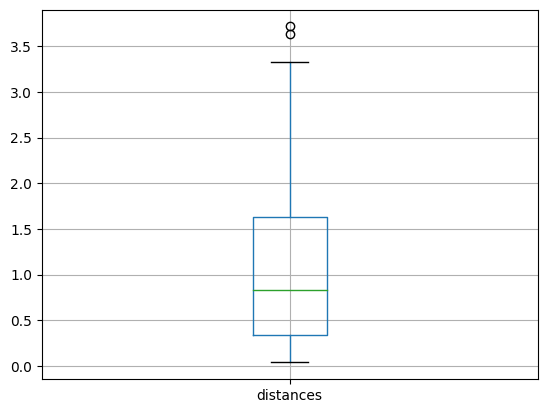

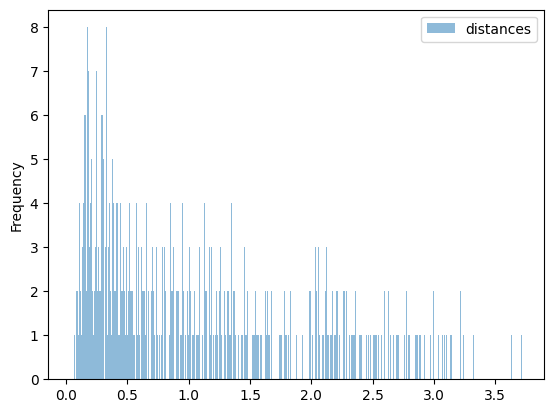

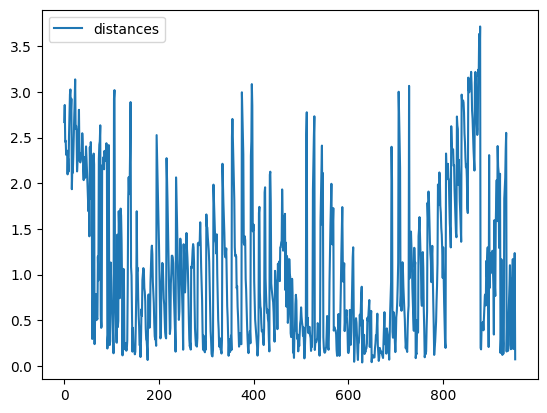

[Open3D INFO] Window window_35 created.


WebVisualizer(window_uid='window_35')

In [44]:
#https://stackoverflow.com/questions/66866952/open3d-compute-distance-between-mesh-and-point-cloud
import copy
import pandas as pd
import numpy as np
import open3d as o3d
from matplotlib import pyplot as plt
from open3d.web_visualizer import draw

# Import 2 clouds, paint and show both
pc_1 = o3d.io.read_point_cloud("data/palm/p1.ply") # 18,421 points
pc_2 = o3d.io.read_point_cloud("data/palm/p2.ply") # 19,051 points
pc_1.paint_uniform_color([0,0,1])
pc_2.paint_uniform_color([0.5,0.5,0])
#o3d.visualization.draw_geometries([pc_1,pc_2])

draw([pc_1, pc_2])
 
# Calculate distances of pc_1 to pc_2. 
dist_pc1_pc2 = pc_1.compute_point_cloud_distance(pc_2)

# dist_pc1_pc2 is an Open3d object, we need to convert it to a numpy array to 
# acess the data
dist_pc1_pc2 = np.asarray(dist_pc1_pc2)

print(dist_pc1_pc2)
# We have 18,421 distances in dist_pc1_pc2, because cloud pc_1 has 18,421 pts.
# Let's make a boxplot, histogram and serie to visualize it.
# We'll use matplotlib + pandas. 
 
df = pd.DataFrame({"distances": dist_pc1_pc2}) # transform to a dataframe
# Some graphs
ax1 = df.boxplot(return_type="axes") # BOXPLOT
ax2 = df.plot(kind="hist", alpha=0.5, bins = 1000) # HISTOGRAM
ax3 = df.plot(kind="line") # SERIE
plt.show()

ind = np.where(dist_pc1_pc2 > 0.5)[0]

pcd_diff = pc_2.select_by_index(ind)
draw(pcd_diff)

In [45]:
import os
import copy
import pandas as pd
import numpy as np
import open3d as o3d

from matplotlib import pyplot as plt
from open3d.web_visualizer import draw



pc_1 = o3d.io.read_point_cloud('data/palm/p1.ply')  
pc_2 = o3d.io.read_point_cloud('data/palm/p2.ply')  
pc_1.paint_uniform_color([0,0,1])
pc_2.paint_uniform_color([0.5,0.5,0])

#draw([pc_1, pc_2])

# Calculate distances of pc_1 to pc_2. 
dist_pc1_pc2 = pc_1.compute_point_cloud_distance(pc_2)

# dist_pc1_pc2 is an Open3d object, we need to convert it to a numpy array to 
# acess the data
dist_pc1_pc2 = np.asarray(dist_pc1_pc2)

#print(dist_pc1_pc2)

# Let's make a boxplot, histogram and serie to visualize it.
# We'll use matplotlib + pandas. 

dist_dict =  dict({'pc1'+'_'+'pc2': dist_pc1_pc2})


ind = np.where(dist_pc1_pc2 > 0.5)[0]

pcd_diff = pc_2.select_by_index(ind)
#draw(pcd_diff)

[721:457][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:39930 (br-104b05af6c0d)
[721:457][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:57067 (docker0)
[721:457][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:50796 (enp6s0)
[721:457][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:47744 (virbr0)
[721:494][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:56226 (br-104b05af6c0d)
[721:494][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:34532 (docker0)
[721:494][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:47108 (enp6s0)
[721:494][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:33944 (virbr0)


In [46]:
import glob
files = glob.glob('data/palm/p?.ply') + glob.glob('data/palm/p??.ply')
files

['/media/hdd10T/3D-dataset/data/palm/p1.ply',
 '/media/hdd10T/3D-dataset/data/palm/p2.ply',
 '/media/hdd10T/3D-dataset/data/palm/p3.ply',
 '/media/hdd10T/3D-dataset/data/palm/p10.ply',
 '/media/hdd10T/3D-dataset/data/palm/p11.ply',
 '/media/hdd10T/3D-dataset/data/palm/p12.ply',
 '/media/hdd10T/3D-dataset/data/palm/p13.ply',
 '/media/hdd10T/3D-dataset/data/palm/p14.ply',
 '/media/hdd10T/3D-dataset/data/palm/p15.ply',
 '/media/hdd10T/3D-dataset/data/palm/p16.ply',
 '/media/hdd10T/3D-dataset/data/palm/p17.ply',
 '/media/hdd10T/3D-dataset/data/palm/p18.ply',
 '/media/hdd10T/3D-dataset/data/palm/p19.ply',
 '/media/hdd10T/3D-dataset/data/palm/p20.ply',
 '/media/hdd10T/3D-dataset/data/palm/p21.ply',
 '/media/hdd10T/3D-dataset/data/palm/p22.ply',
 '/media/hdd10T/3D-dataset/data/palm/p23.ply',
 '/media/hdd10T/3D-dataset/data/palm/p24.ply',
 '/media/hdd10T/3D-dataset/data/palm/p25.ply',
 '/media/hdd10T/3D-dataset/data/palm/p26.ply',
 '/media/hdd10T/3D-dataset/data/palm/p27.ply',
 '/media/hdd10T/

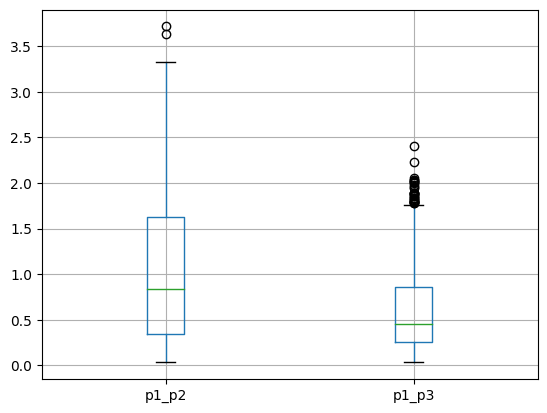

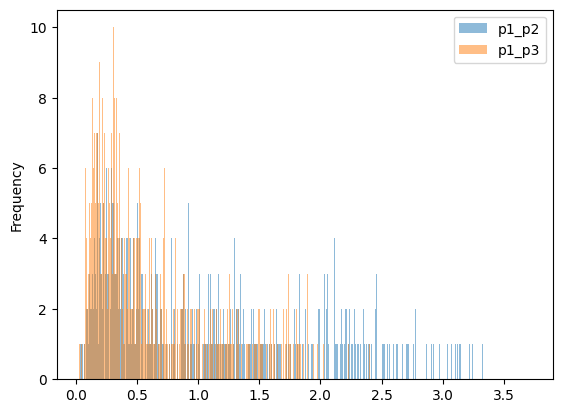

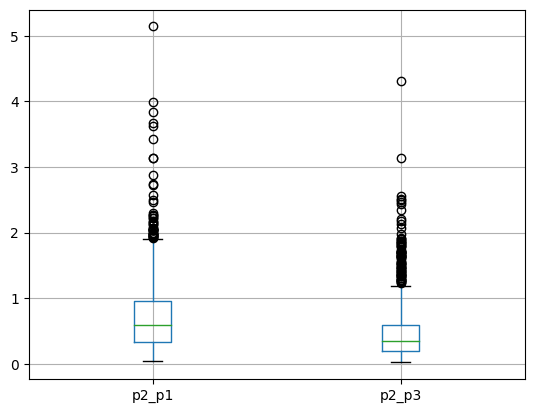

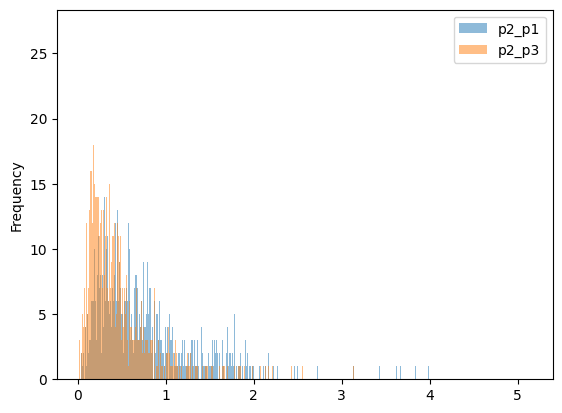

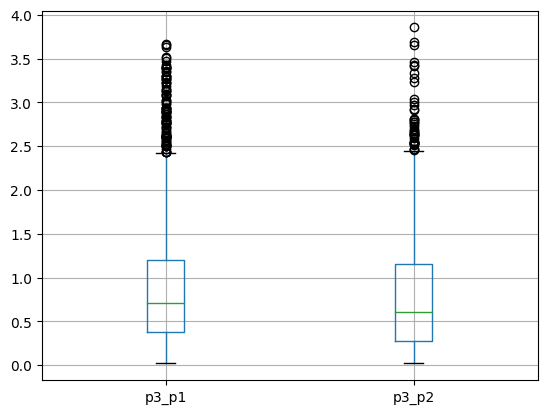

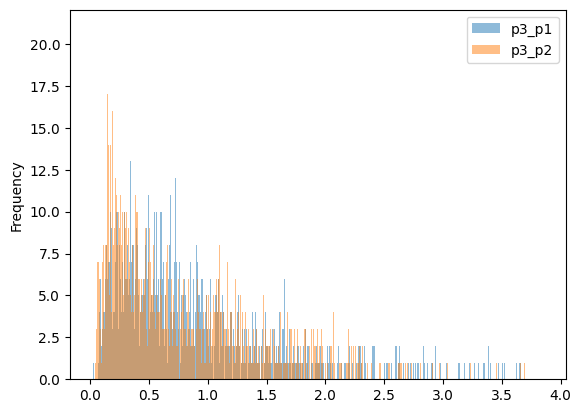

In [47]:
#https://stackoverflow.com/questions/66866952/open3d-compute-distance-between-mesh-and-point-cloud
import os
import copy
import pandas as pd
import numpy as np
import open3d as o3d

from matplotlib import pyplot as plt
from open3d.web_visualizer import draw

import glob
files = glob.glob('data/palm/p?.ply') #+ glob.glob('data/palm/p??.ply')


# Import 2 clouds, paint and show both

set_count = 100

i = 0

for file1 in files:
    dist_dict = dict()
    for file2 in files:
        #print(file1,file2)
        if file1 == file2:
            continue
            
        _,name1 = os.path.split(file1)
        _,name2 = os.path.split(file2) 
        name1 = name1.split('.')[0]
        name2 = name2.split('.')[0]
        #print(name1,name2)
        
        pc_1 = o3d.io.read_point_cloud(file1)  
        pc_2 = o3d.io.read_point_cloud(file2)  
        pc_1.paint_uniform_color([0,0,1])
        pc_2.paint_uniform_color([0.5,0.5,0])
 
        #draw([pc_1, pc_2])
 
        # Calculate distances of pc_1 to pc_2. 
        dist_pc1_pc2 = pc_1.compute_point_cloud_distance(pc_2)
        dist_pc1_pc2 = np.asarray(dist_pc1_pc2)

        #print(dist_pc1_pc2)
         
        # Let's make a boxplot, histogram and serie to visualize it.
        # We'll use matplotlib + pandas. 
        
        dist_dict[name1+'_'+name2] =  dist_pc1_pc2
         
        
        #ind = np.where(dist_pc1_pc2 > 0.5)[0]

        #pcd_diff = pc_2.select_by_index(ind)
        #draw(pcd_diff)
         
        i = i +1
        
    # Some graphs
    
    df = pd.DataFrame(dist_dict) # transform to a dataframe
    #print(df)  
    df.boxplot(return_type="axes") # BOXPLOT
    ax2 = df.plot(kind="hist", alpha=0.5, bins = 1000) # HISTOGRAM
    #ax3 = df.plot(kind="line") # SERIE
    plt.show()
    
    if i > set_count:
            break

#print(dist_dict)
        
         

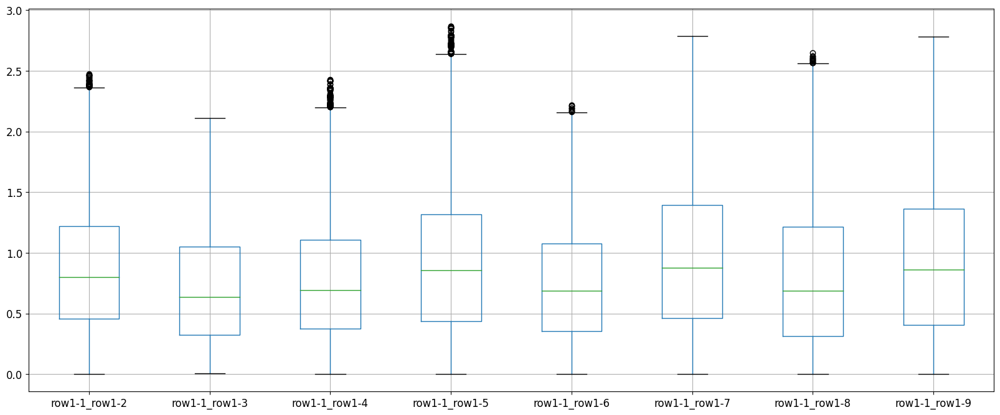

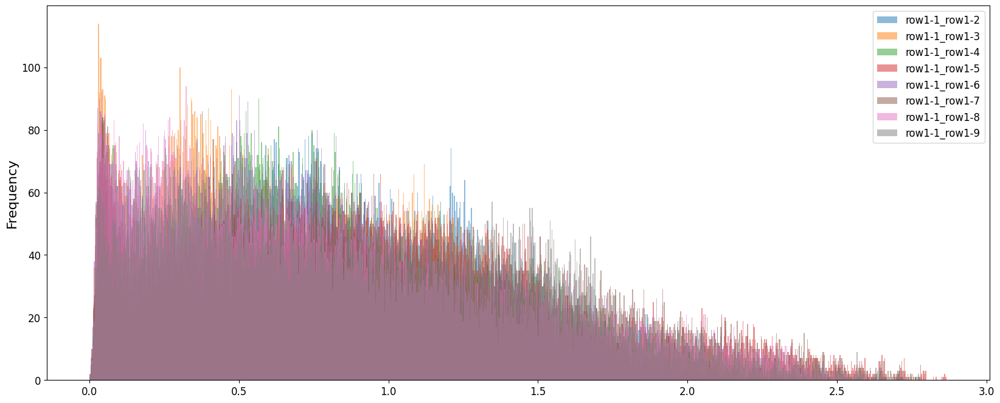

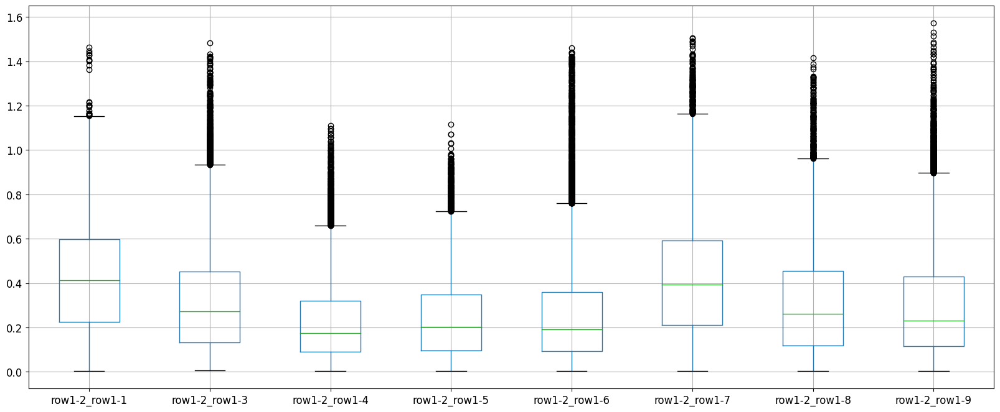

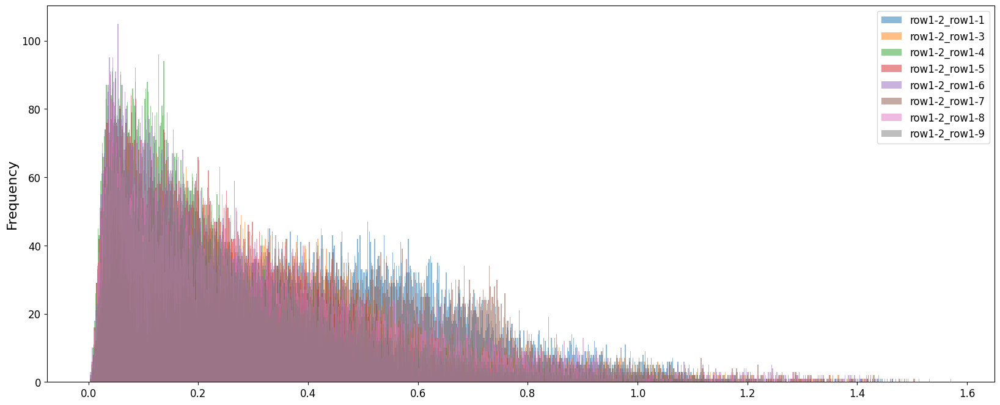

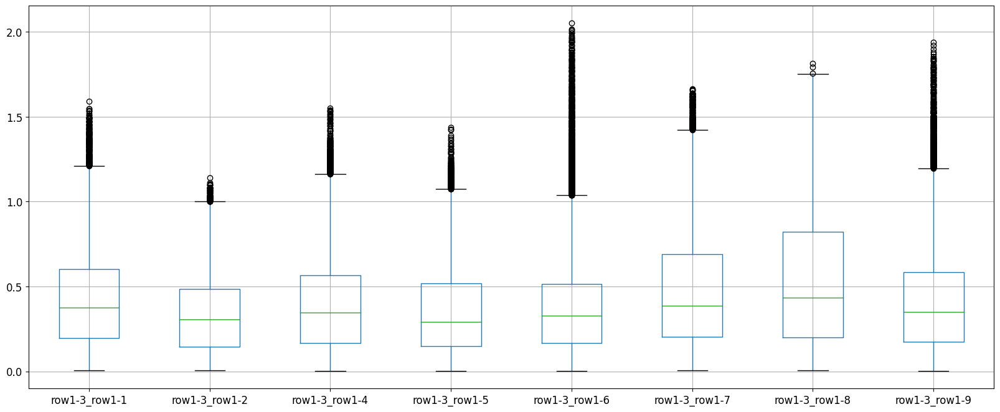

...

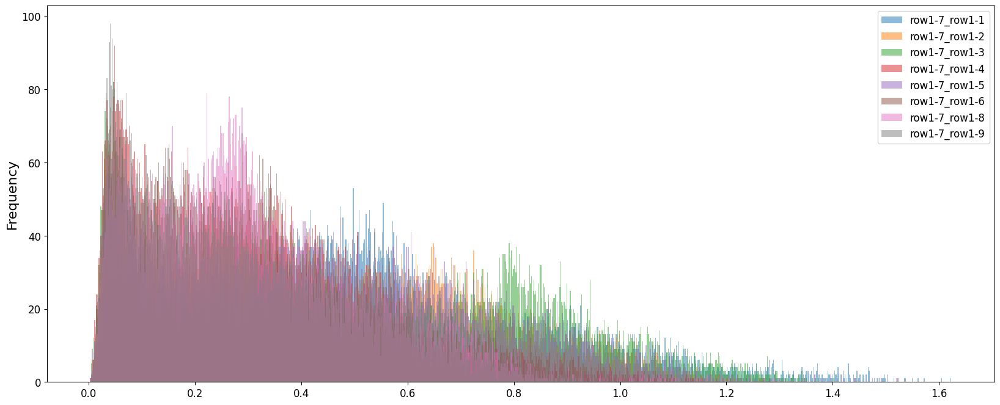

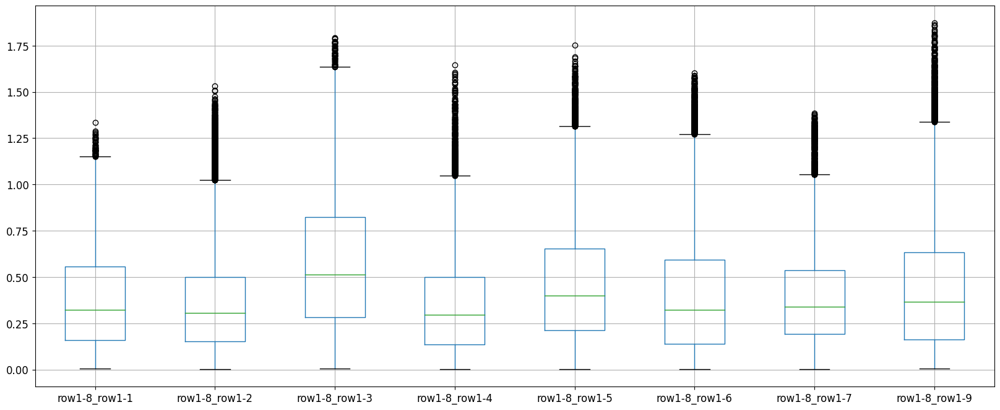

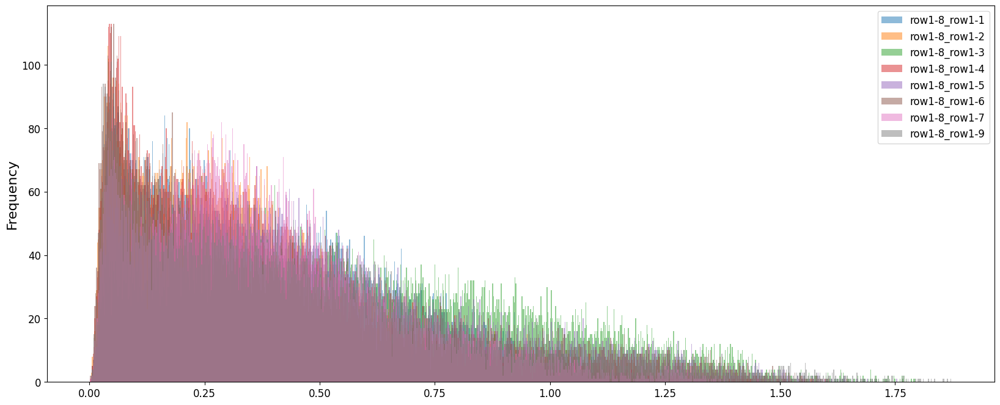

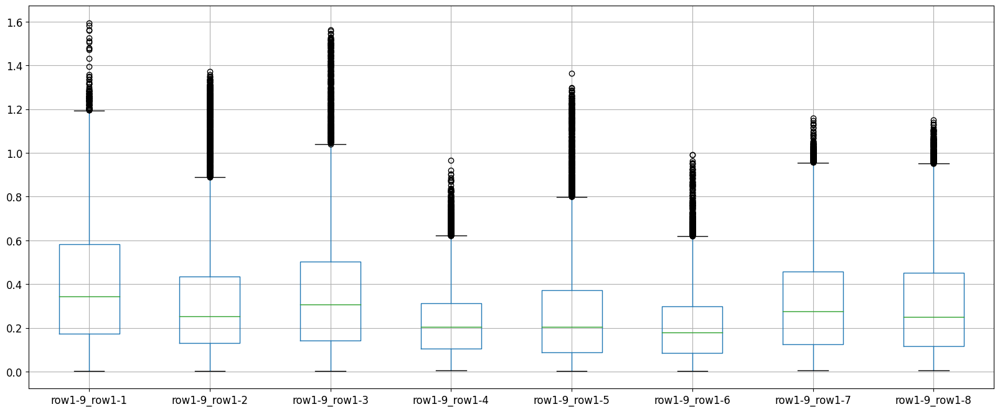

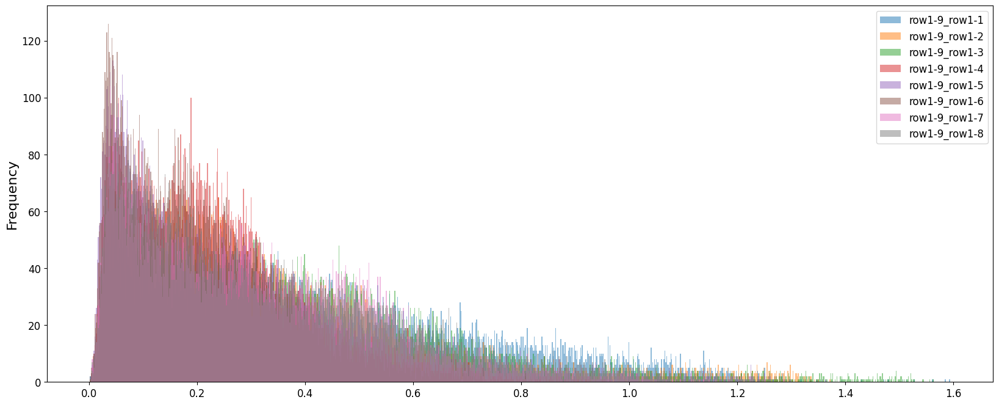

In [48]:
#https://stackoverflow.com/questions/66866952/open3d-compute-distance-between-mesh-and-point-cloud
import os
import copy
import pandas as pd
import numpy as np
import open3d as o3d

from matplotlib import pyplot as plt
from open3d.web_visualizer import draw

import glob
files = glob.glob('data/coconut/row1-?.ply') #+ glob.glob('data/palm/p??.ply')

pd.set_option('display.max_rows', 2500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 2000)
pd.set_option('display.width', 2000)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

size = 16
params = {'legend.fontsize': 'large',
          'figure.figsize': (20,8),
          'axes.labelsize': size,
          'axes.titlesize': size,
          'xtick.labelsize': size*0.75,
          'ytick.labelsize': size*0.75,
          'axes.titlepad': 25}
plt.rcParams.update(params)

# Import 2 clouds, paint and show both

set_count = 100

i = 0

for file1 in files:
    dist_dict = dict()
    for file2 in files:
        #print(file1,file2)
        if file1 == file2:
            continue
            
        _,name1 = os.path.split(file1)
        _,name2 = os.path.split(file2) 
        name1 = name1.split('.')[0]
        name2 = name2.split('.')[0]
        #print(name1,name2)
        
        pc_1 = o3d.io.read_point_cloud(file1)  
        pc_2 = o3d.io.read_point_cloud(file2)  
        pc_1.paint_uniform_color([0,0,1])
        pc_2.paint_uniform_color([0.5,0.5,0])
 
        #draw([pc_1, pc_2])
 
        # Calculate distances of pc_1 to pc_2. 
        dist_pc1_pc2 = pc_1.compute_point_cloud_distance(pc_2)
        dist_pc1_pc2 = np.asarray(dist_pc1_pc2)

        #print(dist_pc1_pc2)
         
        # Let's make a boxplot, histogram and serie to visualize it.
        # We'll use matplotlib + pandas. 
        
        dist_dict[name1+'_'+name2] =  dist_pc1_pc2
         
        
        #ind = np.where(dist_pc1_pc2 > 0.5)[0]

        #pcd_diff = pc_2.select_by_index(ind)
        #draw(pcd_diff)
         
        i = i +1
        
    # Some graphs
    
    df = pd.DataFrame(dist_dict) # transform to a dataframe
    #print(df)  
    df.boxplot(return_type="axes") # BOXPLOT
    ax2 = df.plot(kind="hist", alpha=0.5, bins = 1000) # HISTOGRAM
    #ax3 = df.plot(kind="line") # SERIE
    plt.show()
    
    if i > set_count:
            break

#print(dist_dict)
        

[Open3D INFO] Window window_36 created.


WebVisualizer(window_uid='window_36')

[   40    59    67 ... 14867 14868 14896]
PointCloud with 4435 points.
[Open3D INFO] Window window_37 created.


WebVisualizer(window_uid='window_37')

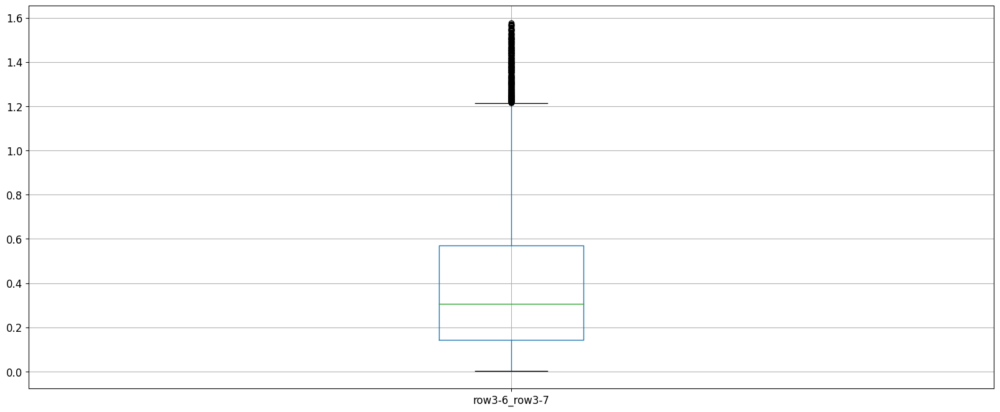

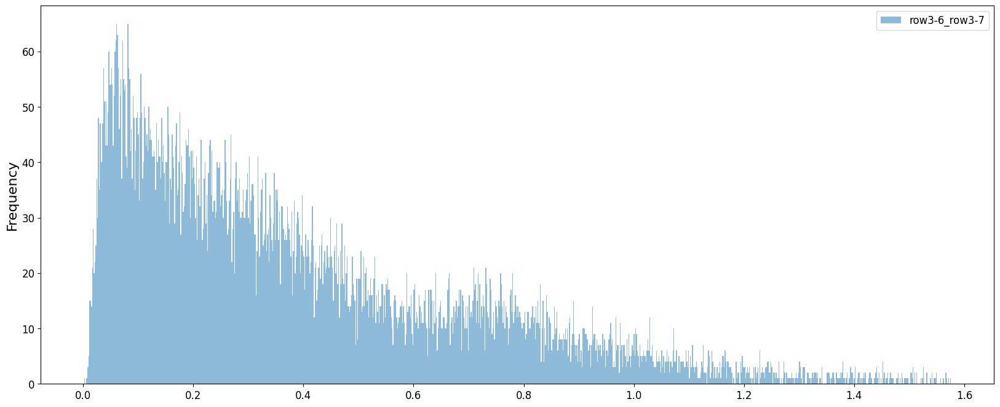

In [49]:
#https://stackoverflow.com/questions/66866952/open3d-compute-distance-between-mesh-and-point-cloud
import os
import copy
import pandas as pd
import numpy as np
import open3d as o3d

from matplotlib import pyplot as plt
from open3d.web_visualizer import draw

import glob
file1 =  'data/coconut/row3-6.ply'
file2 = 'data/coconut/row3-7.ply' 

pd.set_option('display.max_rows', 2500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 2000)
pd.set_option('display.width', 2000)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

size = 16
params = {'legend.fontsize': 'large',
          'figure.figsize': (20,8),
          'axes.labelsize': size,
          'axes.titlesize': size,
          'xtick.labelsize': size*0.75,
          'ytick.labelsize': size*0.75,
          'axes.titlepad': 25}
plt.rcParams.update(params)

# Import 2 clouds, paint and show both

 

dist_dict = dict()

 

_,name1 = os.path.split(file1)
_,name2 = os.path.split(file2) 
name1 = name1.split('.')[0]
name2 = name2.split('.')[0]
#print(name1,name2)

pc_1 = o3d.io.read_point_cloud(file1)  
pc_2 = o3d.io.read_point_cloud(file2)  
pc_1.paint_uniform_color([0,0,1])
pc_2.paint_uniform_color([0.5,0.5,0])

draw([pc_1, pc_2])

# Calculate distances of pc_1 to pc_2. 
dist_pc1_pc2 = pc_1.compute_point_cloud_distance(pc_2)
dist_pc1_pc2 = np.asarray(dist_pc1_pc2)

#print(dist_pc1_pc2)

# Let's make a boxplot, histogram and serie to visualize it.
# We'll use matplotlib + pandas. 

dist_dict[name1+'_'+name2] =  dist_pc1_pc2


ind = np.where(dist_pc1_pc2 > 0.5)[0]
print(ind)

pcd_diff = pc_2.select_by_index(ind)
print(pcd_diff)
draw(pcd_diff)
 
 

df = pd.DataFrame(dist_dict) # transform to a dataframe
#print(df)  
df.boxplot(return_type="axes") # BOXPLOT
ax2 = df.plot(kind="hist", alpha=0.5, bins = 1000) # HISTOGRAM
#ax3 = df.plot(kind="line") # SERIE
plt.show()

 

#print(dist_dict)
        

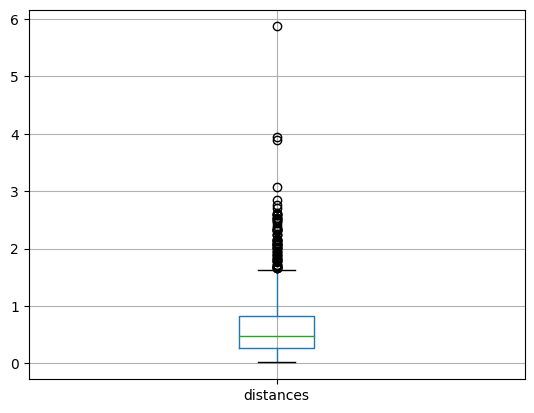

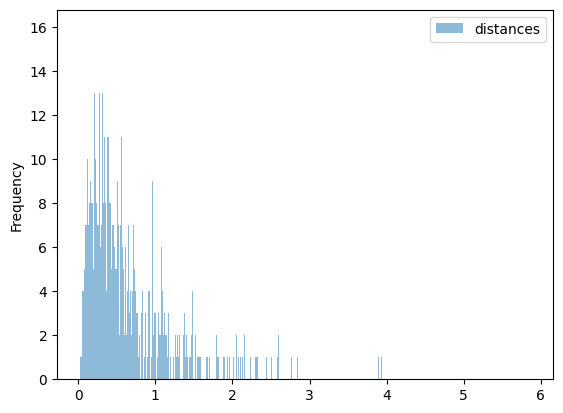

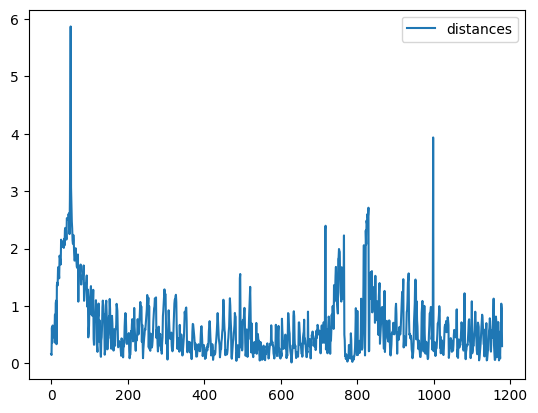

In [4]:
# Load a previos transformation to register pc_2 on pc_1 
# I finded it with the Fast Global Registration algorithm, in Open3D 
T = np.array([[ 0.997, -0.062 ,  0.038,  1.161],
              [ 0.062,  0.9980,  0.002,  0.031],
              [-0.038,  0.001,  0.999,  0.077],
              [ 0.0,    0.0  ,  0.0   , 1.0  ]])
# Make a copy of pc_2 to preserv the original cloud
pc_2_copy = copy.deepcopy(pc_2)
# Aply the transformation T on pc_2_copy
pc_2_copy.transform(T)
#o3d.visualization.draw_geometries([pc_1,pc_2_copy]) # show again
# Calculate distances
dist_pc1_pc2_transformed = pc_1.compute_point_cloud_distance(pc_2_copy)
dist_pc1_pc2_transformed = np.asarray(dist_pc1_pc2_transformed)
# Do as before to show diferences
df_2 = pd.DataFrame({"distances": dist_pc1_pc2_transformed})
# Some graphs (after registration)
ax1 = df_2.boxplot(return_type="axes") # BOXPLOT
ax2 = df_2.plot(kind="hist", alpha=0.5, bins = 1000) # HISTOGRAM
ax3 = df_2.plot(kind="line") # SERIE
plt.show()

# Visual point cloud property

after running pcd_get_prop.py, we get palm_pcd_prop.csv, coconut_pcd_prop.csv

see pcd_get_prop.py

for formating the column heading

## palm pcd property

In [50]:
import  pandas as pd


pcd_data_prop_file = 'csv/palm_pcd_prop.csv'


In [51]:
df = pd.read_csv(pcd_data_prop_file,index_col=False, delimiter='#')
df.head(2)

,name,points,aabb_max,aabb_min,obb_max,obb_min,abb_vol,obb_vol,center,voxel_grid,avg_dist,bpa_mesh,poison_mesh,poison_avg_density,convex_hull,convex_hull_pts
0,p1.ply,953,[4.63392369 5.35084545 2.93490266],[-3.99559292 -5.26512135 -4.99509765],[6.6957695 6.60703175 6.43031642],[-7.74950337 -8.60234116 -8.91357619],726.473,723.419,[-4.44650337e-11 -8.77085006e-11 -4.41386463e-15],2,0.270,TriangleMesh with 953 points and 1222 triangles.,TriangleMesh with 4135 points and 8114 triangles.,4.209,TriangleMesh with 44 points and 84 triangles.,"[98, 546, 466, 788, 878, 353, 459, 728, 706, 467, 464, 435, 139, 140, 919, 195, 460, 853, 868, 867, 124, 121, 70, 0, 322, 287, 288, 258, 148, 186, 375, 138, 161, 629, 612, 396, 356, 267, 434, 105, 355, 193, 261, 106]"
1,p2.ply,1373,[4.11424497 4.10224762 2.00170534],[-3.59245059 -4.4050766 -5.92829497],[7.12264526 5.47803726 5.43651884],[-5.91190051 -6.54232507 -8.19517336],519.917,521.379,[ 3.76463240e-11 6.52875439e-11 -1.55253329e-15],2,0.215,TriangleMesh with 1373 points and 1027 triangles.,TriangleMesh with 4090 points and 7942 triangles.,4.457,TriangleMesh with 78 points and 152 triangles.,"[1267, 1048, 1032, 985, 208, 1030, 1022, 136, 438, 16, 7, 1, 1355, 998, 959, 1061, 525, 1026, 1052, 1031, 1055, 178, 29, 1351, 926, 1007, 577, 2, 1073, 1076, 1067, 156, 1272, 1249, 1273, 1151, 1122, 1036, 1111, 1242, 1100, 1274, 1098, 1150, 778, 825, 506, 538, 1027, 1059, 597, 594, 1016, 579, 1312, 1352, 431, 946, 1060, 209, 908, 1085, 1110, 1074, 3, 578, 28, 27, 1266, 1072, 237, 1075, 1077, 1096, 1097, 1033, 1299, 1118]"


[855:196][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:42875 (br-104b05af6c0d)
[855:196][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:43002 (docker0)
[855:196][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:47161 (enp6s0)
[855:196][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:38097 (virbr0)
[855:200][985340] (stun_port.cc:96): Binding request timed out from 172.18.0.x:50616 (br-104b05af6c0d)
[855:200][985340] (stun_port.cc:96): Binding request timed out from 172.17.0.x:37736 (docker0)
[855:200][985340] (stun_port.cc:96): Binding request timed out from 158.108.180.x:46491 (enp6s0)
[855:200][985340] (stun_port.cc:96): Binding request timed out from 192.168.122.x:57204 (virbr0)


In [112]:
df.columns

Index(['name ', ' points', ' aabb_max ', ' aabb_min ', ' obb_max ',
       ' obb_min ', ' abb_vol', ' obb_vol ', ' center ', ' voxel_grid ',
       ' avg_dist ', ' poison_avg_density  ', ' convex_hull_pts  ',
       ' bpa_mesh _points', ' bpa_mesh _triangle', '  poison_mesh _points',
       '  poison_mesh _triangle', ' convex_hull _points',
       ' convex_hull _triangle'],
      dtype='object')

In [93]:
str( df[' bpa_mesh '].values)

"['TriangleMesh with 953 points and 1222 triangles.'\n 'TriangleMesh with 1373 points and 1027 triangles.'\n 'TriangleMesh with 2067 points and 1339 triangles.'\n 'TriangleMesh with 2007 points and 2024 triangles.'\n 'TriangleMesh with 1272 points and 1190 triangles.'\n 'TriangleMesh with 1424 points and 1321 triangles.'\n 'TriangleMesh with 2063 points and 2128 triangles.'\n 'TriangleMesh with 900 points and 794 triangles.'\n 'TriangleMesh with 1179 points and 951 triangles.'\n 'TriangleMesh with 1436 points and 1300 triangles.'\n 'TriangleMesh with 1102 points and 1248 triangles.'\n 'TriangleMesh with 1079 points and 829 triangles.'\n 'TriangleMesh with 1294 points and 928 triangles.'\n 'TriangleMesh with 939 points and 785 triangles.'\n 'TriangleMesh with 1792 points and 1254 triangles.'\n 'TriangleMesh with 1870 points and 1276 triangles.'\n 'TriangleMesh with 1240 points and 873 triangles.'\n 'TriangleMesh with 1393 points and 1252 triangles.'\n 'TriangleMesh with 1566 points and 

In [131]:
#clean data fields

all_field =  [' bpa_mesh ','  poison_mesh ',' convex_hull ']
for field in all_field:
     
    all_data_list = df[field].values
    
    for all_data in all_data_list:
        all_data = all_data.split()
    
        #print(all_data)
        df[field+'_points'] = int(all_data[5])
        df[field+'_triangle'] = int(all_data[2])

df = df.drop(columns=all_field)


In [115]:

df.columns

Index(['name ', ' points', ' aabb_max ', ' aabb_min ', ' obb_max ',
       ' obb_min ', ' abb_vol', ' obb_vol ', ' center ', ' voxel_grid ',
       ' avg_dist ', ' poison_avg_density  ', ' convex_hull_pts  ',
       ' bpa_mesh _points', ' bpa_mesh _triangle', '  poison_mesh _points',
       '  poison_mesh _triangle', ' convex_hull _points',
       ' convex_hull _triangle'],
      dtype='object')

In [132]:


df.filter(['name ', ' points',' abb_vol', ' obb_vol ',
           ' avg_dist ', ' poison_avg_density  ',  ' voxel_grid ',
           ' bpa_mesh _points', ' bpa_mesh _triangle', '  poison_mesh _points',
           '  poison_mesh _triangle', ' convex_hull _points',
           ' convex_hull _triangle']),
           
df.describe().to_csv('palm_pcd_describe.csv')
df.describe()

,points,abb_vol,obb_vol,voxel_grid,avg_dist,poison_avg_density,bpa_mesh _points,bpa_mesh _triangle,poison_mesh _points,poison_mesh _triangle,convex_hull _points,convex_hull _triangle
count,40.000000,40.000000,40.000000,40.0,40.000000,40.000000,40.0,40.0,40.0,40.0,40.0,40.0
mean,1432.950000,657.148707,635.991612,2.0,0.219972,4.607511,1665.0,1474.0,10680.0,5435.0,100.0,52.0
std,401.893719,265.956440,265.972042,0.0,0.021880,0.194921,0.0,0.0,0.0,0.0,0.0,0.0
min,761.000000,232.658470,218.744501,2.0,0.178770,4.011390,1665.0,1474.0,10680.0,5435.0,100.0,52.0
25%,1175.500000,452.715814,449.975176,2.0,0.206306,4.518906,1665.0,1474.0,10680.0,5435.0,100.0,52.0
50%,1408.500000,597.840298,585.317612,2.0,0.216128,4.665165,1665.0,1474.0,10680.0,5435.0,100.0,52.0
75%,1600.000000,829.732637,776.991482,2.0,0.234842,4.735690,1665.0,1474.0,10680.0,5435.0,100.0,52.0
max,2825.000000,1276.222345,1456.473570,2.0,0.269738,4.993769,1665.0,1474.0,10680.0,5435.0,100.0,52.0


## coconut pcd property


In [52]:
pcd_data_prop_file = 'csv/coconut_pcd_prop.csv'

In [53]:
df = pd.read_csv(pcd_data_prop_file,index_col=False, delimiter='#')
df.head(2)

,name,points,aabb_max,aabb_min,obb_max,obb_min,abb_vol,obb_vol,center,voxel_grid,avg_dist,bpa_mesh,poison_mesh,poison_avg_density,convex_hull,convex_hull_pts
0,row2-11.ply,19332,[3.4452412 3.52545291 3.06002595],[-3.01874806 -3.20854825 -1.47397445],[6.11727214 5.23033884 3.54811947],[-5.28906098 -5.8311525 -2.35081412],197.358,287.706,[-4.58429074e-14 8.44936462e-15 -5.98666173e-15],2,0.046,TriangleMesh with 19332 points and 5021 triangles.,TriangleMesh with 78853 points and 157720 triangles.,6.232,TriangleMesh with 111 points and 218 triangles.,"[353, 17857, 6526, 14629, 18994, 12823, 1772, 15087, 17018, 5672, 18687, 9265, 6092, 10725, 14842, 10697, 10694, 13429, 7712, 18104, 15825, 16439, 9185, 16447, 6607, 12566, 918, 813, 11907, 10494, 15727, 5657, 18625, 12262, 14656, 18634, 11929, 17813, 5444, 18486, 19041, 15387, 16454, 5979, 16799, 702, 7367, 6591, 17907, 8174, 13160, 40, 8146, 99, 8433, 14109, 16623, 10698, 6754, 9393, 6619, 4667, 19070, 12790, 5978, 12324, 19330, 920, 984, 738, 14844, 656, 14154, 15860, 5956, 13180, 17069, 10470, 10701, 12329, 13258, 4718, 12313, 19096, 4631, 12334, 15649, 14299, 11874, 15861, 10055, 13229, 7355, 8435, 4694, 12565, 17855, 16448, 17869, 12721, 15853, 867, 11290, 819, 13819, 19318, 7788, 14767, 10048, 8445, 12585]"
1,row2-12.ply,13468,[3.14737607 2.55581243 2.60404464],[-2.53261661 -2.65018694 -1.80995539],[4.42786511 4.51689137 3.18886943],[-5.14232544 -4.93666604 -2.91400234],130.522,200.830,[-4.63450434e-14 -1.66813730e-14 -6.08113368e-15],2,0.050,TriangleMesh with 13468 points and 4242 triangles.,TriangleMesh with 56311 points and 112818 triangles.,5.790,TriangleMesh with 142 points and 280 triangles.,"[6747, 2741, 765, 11076, 4389, 5387, 11178, 12331, 7667, 9962, 9545, 5278, 156, 7407, 7951, 10581, 11255, 12307, 3183, 3810, 6973, 6659, 2938, 7627, 12253, 6196, 10613, 10598, 10611, 7639, 3473, 12344, 6327, 4171, 3870, 6821, 6785, 6065, 220, 875, 6368, 10116, 6201, 8252, 13436, 3068, 12326, 4455, 5265, 5264, 7470, 4141, 4167, 4373, 12795, 3596, 3467, 12397, 3409, 708, 10038, 5369, 2327, 11818, 11982, 4781, 12647, 5281, 8476, 7455, 12003, 56, 25, 4170, 4169, 13233, 6846, 11189, 6407, 4168, 3598, 3719, 10547, 6990, 6248, 5409, 1669, 1734, 11959, 11104, 5560, 6772, 6265, 11573, 5280, 9394, 11697, 9890, 157, 11602, 11762, 9330, 5866, 9919, 9903, 11656, 5870, 6341, 10578, 3718, 10538, 4172, 1121, 1733, 13379, 160, 9321, 9926, 108, 6329, 9354, 9911, 9516, 6374, 159, 11742, 13304, 7471, 98, 6339, 11081, 158, 7468, 102, 58, 4, 3599, 11070, 5867, 7466, 1859, 3069]"


In [135]:
#clean data fields

all_field =  [' bpa_mesh ','  poison_mesh ',' convex_hull ']
for field in all_field:
     
    all_data_list = df[field].values
    
    for all_data in all_data_list:
        all_data = all_data.split()
    
        #print(all_data)
        df[field+'_points'] = int(all_data[5])
        df[field+'_triangle'] = int(all_data[2])

df = df.drop(columns=all_field)

df.filter(['name ', ' points',' abb_vol', ' obb_vol ',
           ' avg_dist ', ' poison_avg_density  ',  ' voxel_grid ',
           ' bpa_mesh _points', ' bpa_mesh _triangle', '  poison_mesh _points',
           '  poison_mesh _triangle', ' convex_hull _points',
           ' convex_hull _triangle']),
           
df.describe().to_csv('coconut_pcd_describe.csv')
df.describe()

,points,abb_vol,obb_vol,voxel_grid,avg_dist,poison_avg_density,bpa_mesh _points,bpa_mesh _triangle,poison_mesh _points,poison_mesh _triangle,convex_hull _points,convex_hull _triangle
count,110.000000,110.000000,110.000000,110.0,110.000000,110.000000,110.0,110.0,110.0,110.0,110.0,110.0
mean,15090.372727,128.118682,180.702584,2.0,0.045693,5.949984,4492.0,15946.0,122161.0,61016.0,234.0,119.0
std,3582.076454,46.982190,57.042247,0.0,0.002086,0.237390,0.0,0.0,0.0,0.0,0.0,0.0
min,8404.000000,63.559253,82.833891,2.0,0.040691,5.567492,4492.0,15946.0,122161.0,61016.0,234.0,119.0
25%,12463.750000,99.308114,145.332648,2.0,0.044369,5.783218,4492.0,15946.0,122161.0,61016.0,234.0,119.0
50%,14753.000000,121.364001,174.897713,2.0,0.045667,5.901672,4492.0,15946.0,122161.0,61016.0,234.0,119.0
75%,16970.750000,148.439372,200.694217,2.0,0.047086,6.052782,4492.0,15946.0,122161.0,61016.0,234.0,119.0
max,28328.000000,425.042921,428.494412,2.0,0.050460,6.783174,4492.0,15946.0,122161.0,61016.0,234.0,119.0
